# CAMELs Routing

The CAMELs LSTM trained by Dr. Frame was focused on runoff depth. If we calculate runoff depth for individual basins in NextGen, we are getting small values for each sub-basin at every time step. We are gonna try to combine this runoff to compare to the observed streamflow data from USGS. We are going to do this by taking the product of the sub-basin area and its predicted depth, and then summing at each time step. 

### WARNING: Make sure to change the directories accordingly!!!

In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go

In [2]:
# select from :
### ./lstm/
### ./lstm/old/
### ./lstm/2024/
### ./lstm_camels/
### ./lstm_camels/2024/
### ./lstm_camels/old/
### ./lstm_frame/
### ./lstm_frame/2024/
### ./lstm_frame/old/

input_dir = "./lstm_camels/" ### MAKE SURE THERE IS A FINAL '/' 
# area_csv = "../data/lstm/yml_files/basin_info/clear_ck.v201.basin_areas.csv" # OLD HF
area_csv = "../data/lstm/yml_files/basin_info/clear_ck.v2_2.basin_areas.csv" # NEW HF

df_area = pd.read_csv(area_csv)
area_dict = df_area.set_index("id")["areasqkm"].to_dict()
# area_dict

## Using Nexus Files

In [3]:
pattern = os.path.join(input_dir, 'nex-*')
nexus_list = glob.glob(pattern)

In [4]:
basin_list = []
weighted_runoffs = []

for file in nexus_list:
    basename = os.path.basename(file)
    basin_id = basename.split('_')[0]
    basin_id = "wb-" + basin_id.split('-')[1]
    basin_list.append(basin_id)
    
    area = area_dict.get(basin_id)
    if area is None:
        print(f"Area not found for sub-basin {basin_id}, skipping")
        continue
        
    #print(basin_id, area)
    
    # read in data
    df = pd.read_csv(file, names=["Index", "Date", "Runoff"], header=None)
    df.drop(columns=["Index"], inplace=True)
    df['Date'] = pd.to_datetime(df['Date'])
    df.set_index('Date', inplace=True)
    
    weighted = df['Runoff'] * area
    weighted_runoffs.append(weighted)
    
# Sum all weighted runoff across basins
total_weighted_runoff = pd.concat(weighted_runoffs, axis=1).sum(axis=1)
total_weighted_runoff.name = 'total_weighted_runoff'

Area not found for sub-basin wb-1570824, skipping


In [5]:
basin_list[:5]

['wb-1570882', 'wb-1570864', 'wb-1570817', 'wb-1570843', 'wb-1570879']

In [6]:
area_dict.get('wb-1561708')

In [7]:
weighted_runoffs[:5]

[Date
 2014-10-01 00:00:00    0.021068
 2014-10-01 01:00:00    0.021227
 2014-10-01 02:00:00    0.019788
 2014-10-01 03:00:00    0.017457
 2014-10-01 04:00:00    0.014973
                          ...   
 2023-09-30 19:00:00    0.003217
 2023-09-30 20:00:00    0.003175
 2023-09-30 21:00:00    0.003195
 2023-09-30 22:00:00    0.003138
 2023-09-30 23:00:00    0.003133
 Name: Runoff, Length: 78888, dtype: float64,
 Date
 2014-10-01 00:00:00    0.089361
 2014-10-01 01:00:00    0.094008
 2014-10-01 02:00:00    0.103454
 2014-10-01 03:00:00    0.113377
 2014-10-01 04:00:00    0.118850
                          ...   
 2023-09-30 19:00:00    0.001450
 2023-09-30 20:00:00    0.001321
 2023-09-30 21:00:00    0.001101
 2023-09-30 22:00:00    0.001048
 2023-09-30 23:00:00    0.001521
 Name: Runoff, Length: 78888, dtype: float64,
 Date
 2014-10-01 00:00:00    0.728310
 2014-10-01 01:00:00    0.771602
 2014-10-01 02:00:00    0.875998
 2014-10-01 03:00:00    0.979899
 2014-10-01 04:00:00    1.077728

In [8]:
df_total = total_weighted_runoff.to_frame()
df_total.head()

,total_weighted_runoff
Date,
2014-10-01 00:00:00,120.184202
2014-10-01 01:00:00,124.871777
2014-10-01 02:00:00,129.725432
2014-10-01 03:00:00,131.266978
2014-10-01 04:00:00,132.302703


In [9]:
df_total["average_runoff"] = df_total["total_weighted_runoff"] / (1008.64 * 10e5) # divide by total area
df_total["flow_rate"] = df_total["total_weighted_runoff"] / 3600
df_total["streamflow"] = df_total["flow_rate"] * 35.3147
df_total.head()

,total_weighted_runoff,average_runoff,flow_rate,streamflow
Date,,,,
2014-10-01 00:00:00,120.184202,1.191547e-07,0.033385,1.178964
2014-10-01 01:00:00,124.871777,1.238021e-07,0.034687,1.224947
2014-10-01 02:00:00,129.725432,1.286142e-07,0.036035,1.272560
2014-10-01 03:00:00,131.266978,1.301425e-07,0.036463,1.287682
2014-10-01 04:00:00,132.302703,1.311694e-07,0.036751,1.297842


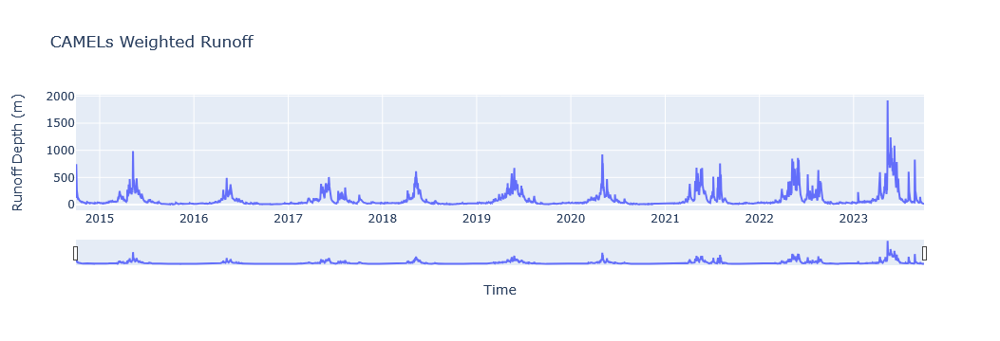

In [10]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_total.index, y=df_total['total_weighted_runoff'], mode='lines'))

# Update layout with title and axis labels
fig.update_layout(
    title="CAMELs Weighted Runoff",
    xaxis_title="Time",
    yaxis_title="Runoff Depth (m)",
    xaxis=dict(rangeslider=dict(visible=True))
)

fig.show()

In [11]:
output_file = input_dir + "weighted_nexus.csv"
df_total.to_csv(output_file)

## Using Catchment (wb)

In [12]:
# pattern = os.path.join(input_dir, 'wb-*') # OLD HF 
pattern = os.path.join(input_dir, 'cat-*') # NEW HF
nexus_list = glob.glob(pattern)

In [13]:
basin_list = []
weighted_runoffs = []
weighted_streamflow = []

for file in nexus_list:
    basename = os.path.basename(file)
    basin_id = basename.split('.')[0]
    basin_id = "wb-" + basin_id.split('-')[1]
    basin_list.append(basin_id)
    
    area = area_dict.get(basin_id)
    if area is None:
        print(f"Area not found for sub-basin {basin_id}, skipping")
        continue
    
    # read in data
    df = pd.read_csv(file, header=0)
    df.drop(columns=["Time Step"], inplace=True)
    df.rename(columns={"Time": "Date", "land_surface_water__runoff_depth": "Runoff", "land_surface_water__runoff_volume_flux": "Streamflow"}, inplace=True)
    df.set_index("Date", inplace=True)
    
    weighted_r = df["Runoff"] * area * 1e6
    weighted_s = df['Streamflow'] * area
    weighted_runoffs.append(weighted_r)
    weighted_streamflow.append(weighted_s)
    
# Sum all weighted runoff across basins
total_weighted_runoff = pd.concat(weighted_runoffs, axis=1).sum(axis=1)
total_weighted_runoff.name = 'total_weighted_runoff'

# Sum all weighted streamflow across basins
total_weighted_streamflow = pd.concat(weighted_streamflow, axis=1).sum(axis=1)
total_weighted_streamflow.name = 'total_weighted_streamflow'

In [14]:
basin_list[:5]

['wb-1570816', 'wb-1570932', 'wb-1570935', 'wb-1570811', 'wb-1570863']

In [15]:
area_dict.get('wb-1561688')

In [16]:
weighted_runoffs[:5]

[Date
 2014-10-01 00:00:00    455.797370
 2014-10-01 01:00:00    481.597221
 2014-10-01 02:00:00    558.996775
 2014-10-01 03:00:00    619.196428
 2014-10-01 04:00:00    687.996031
                           ...    
 2023-09-30 19:00:00      8.599950
 2023-09-30 20:00:00      8.599950
 2023-09-30 21:00:00      8.599950
 2023-09-30 22:00:00      8.599950
 2023-09-30 23:00:00      8.599950
 Name: Runoff, Length: 78888, dtype: float64,
 Date
 2014-10-01 00:00:00    623.563193
 2014-10-01 01:00:00    647.546392
 2014-10-01 02:00:00    719.495992
 2014-10-01 03:00:00    803.437191
 2014-10-01 04:00:00    851.403590
                           ...    
 2023-09-30 19:00:00     11.991600
 2023-09-30 20:00:00     11.991600
 2023-09-30 21:00:00     11.991600
 2023-09-30 22:00:00     11.991600
 2023-09-30 23:00:00     11.991600
 Name: Runoff, Length: 78888, dtype: float64,
 Date
 2014-10-01 00:00:00    705.689570
 2014-10-01 01:00:00    733.363671
 2014-10-01 02:00:00    788.711872
 2014-10-01 03:

In [17]:
weighted_streamflow[:5]

[Date
 2014-10-01 00:00:00    1.094937
 2014-10-01 01:00:00    1.157244
 2014-10-01 02:00:00    1.328667
 2014-10-01 03:00:00    1.486106
 2014-10-01 04:00:00    1.652584
                          ...   
 2023-09-30 19:00:00    0.021207
 2023-09-30 20:00:00    0.017312
 2023-09-30 21:00:00    0.015437
 2023-09-30 22:00:00    0.016589
 2023-09-30 23:00:00    0.020700
 Name: Streamflow, Length: 78888, dtype: float64,
 Date
 2014-10-01 00:00:00    2.079871
 2014-10-01 01:00:00    2.172290
 2014-10-01 02:00:00    2.414593
 2014-10-01 03:00:00    2.661056
 2014-10-01 04:00:00    2.842453
                          ...   
 2023-09-30 19:00:00    0.045292
 2023-09-30 20:00:00    0.042378
 2023-09-30 21:00:00    0.045016
 2023-09-30 22:00:00    0.042606
 2023-09-30 23:00:00    0.051528
 Name: Streamflow, Length: 78888, dtype: float64,
 Date
 2014-10-01 00:00:00    2.706748
 2014-10-01 01:00:00    2.797021
 2014-10-01 02:00:00    3.009987
 2014-10-01 03:00:00    3.206723
 2014-10-01 04:00:00    

In [18]:
df_total = total_weighted_runoff.to_frame()
df_total["total_weighted_streamflow"] = total_weighted_streamflow
df_total.head()

,total_weighted_runoff,total_weighted_streamflow
Date,,
2014-10-01 00:00:00,50788.423415,169.906388
2014-10-01 01:00:00,52772.664779,176.676100
2014-10-01 02:00:00,55419.176414,183.531691
2014-10-01 03:00:00,56822.527506,185.729323
2014-10-01 04:00:00,58035.034420,187.228143


In [19]:
df_total["flow_rate"] = df_total["total_weighted_runoff"] / 3600
df_total["streamflow"] = df_total["flow_rate"] * 35.3147
df_total.head()

,total_weighted_runoff,total_weighted_streamflow,flow_rate,streamflow
Date,,,,
2014-10-01 00:00:00,50788.423415,169.906388,14.107895,498.216093
2014-10-01 01:00:00,52772.664779,176.676100,14.659074,517.680785
2014-10-01 02:00:00,55419.176414,183.531691,15.394216,543.642108
2014-10-01 03:00:00,56822.527506,185.729323,15.784035,557.408476
2014-10-01 04:00:00,58035.034420,187.228143,16.120843,569.302731


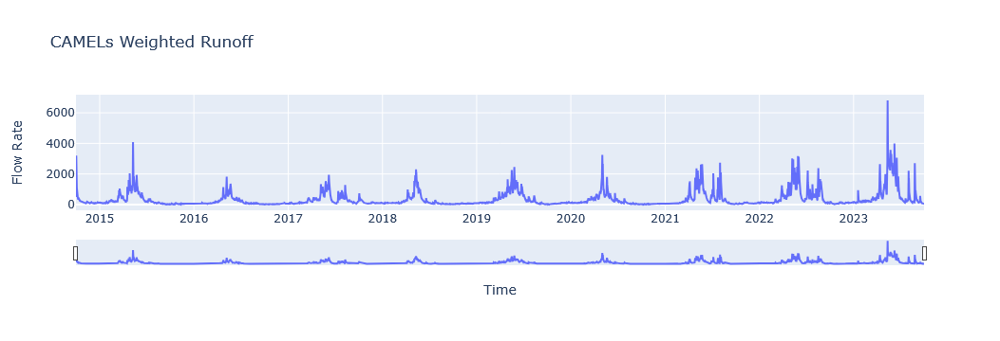

In [20]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_total.index, y=df_total['streamflow'], mode='lines'))

# Update layout with title and axis labels
fig.update_layout(
    title="CAMELs Weighted Runoff",
    xaxis_title="Time",
    yaxis_title="Flow Rate",
    xaxis=dict(rangeslider=dict(visible=True))
)

fig.show()

In [21]:
output_file = input_dir + "weighted_catchment.csv"
df_total.to_csv(output_file)